<a href="https://colab.research.google.com/github/Reevoc/Tesi/blob/main/Tumori_DCGAN_prova_1_benigni.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#DCGAN

##Libreire 

In [29]:
import glob
import imageio
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
import tensorflow as tf
import time
import os
import errno
import keras

from keras import backend
from google.colab import drive
from PIL import Image
from IPython import display
from tensorflow.keras import layers

In [30]:
!pip install imageio
!pip install git+https://github.com/tensorflow/docs

  Cloning https://github.com/tensorflow/docs to /tmp/pip-req-build-p0glea_e
  Running command git clone -q https://github.com/tensorflow/docs /tmp/pip-req-build-p0glea_e
  Created wheel for tensorflow-docs: filename=tensorflow_docs-0.0.0ddf4e80df17e9ab13dca44532da4d0de48a77a8b_-cp36-none-any.whl size=146715 sha256=3cb961b963eebd9c111890c543e9db39e67868cddbc4bae784642901a73653d1
  Stored in directory: /tmp/pip-ephem-wheel-cache-v44gwtpp/wheels/eb/1b/35/fce87697be00d2fc63e0b4b395b0d9c7e391a10e98d9a0d97f
Successfully built tensorflow-docs


##Upload dei dati da Drive

In [31]:
drive.mount('/content/drive', force_remount = True)

Mounted at /content/drive


In [32]:
folder_benign_train = '/content/drive/MyDrive/Dati/train/benign'
read = lambda imname: np.asarray(Image.open(imname).convert('RGB'))
# Carico le immagini di train
ims_benign = [read(os.path.join(folder_benign_train, filename)) for filename in os.listdir(folder_benign_train)]
X_benign = np.array(ims_benign, dtype='uint8')
print("train beningi caricati")

train beningi caricati


In [33]:
folder_malignant_train = '/content/drive/MyDrive/Dati/train/malignant'
read = lambda imname: np.asarray(Image.open(imname).convert('RGB'))
# Carico le immagini di train
ims_malignant = [read(os.path.join(folder_malignant_train, filename)) for filename in os.listdir(folder_malignant_train)]
X_malignant = np.array(ims_malignant, dtype='uint8')
print("train maligni caricati")

train maligni caricati


###Carica o salva il modello 


In [34]:
model_name_folder = 'modello_n_1'
model_name = 'modello_benigni'

In [35]:
def save_model(generator, model_name, model_name_folder):
  try: 
    os.mkdir(f'/content/drive/My Drive/DCGAN/{model_name_folder}/{model_name}')
    filename = f'/content/drive/My Drive/DCGAN/{model_name_folder}/{model_name}'
    generator.save(filename)
  except OSError as e:
    if e.errno == errno.EEXIST:
        print('Folder already exist')
  filename = f'/content/drive/My Drive/DCGAN/{model_name_folder}/{model_name}'
  generator.save(filename)

#**Normalizzazione dei dati** 
Preparo i dati dati per essere utilizzati 
1.   Faccio un reshape e converto in float32
2.   Nomalizzo i dati affinche siano compresi tra i valori 0 e 1
3.   Creo il dataset aggiungedi la dimensione di batch



In [36]:
X_benign = X_benign.reshape(X_benign.shape[0], 224, 224, 3).astype('uint8')
X_malignant = X_malignant.reshape(X_malignant.shape[0], 224, 224, 3).astype('uint8')
print(f'la dimesione =>{X_benign.shape}')
print(f'il numerdo di dimesion =>{X_benign.ndim}') 

"""X_benign = X_benign  / 255
X_malignant = X_malignant / 255"""
X_benign = (X_benign - 127.5) / 127.5 
X_malignant = (X_malignant-127.5 / 127.5)
# Batch and shuffle the data
BUFFER_SIZE = 40000
BATCH_SIZE = 64
train_benign = tf.data.Dataset.from_tensor_slices(X_benign).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
train_malignant = tf.data.Dataset.from_tensor_slices(X_malignant).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

la dimesione =>(1419, 224, 224, 3)
il numerdo di dimesion =>4


https://www.tensorflow.org/api_docs/python/tf/keras/initializers/TruncatedNormal
utilizzo questa distribuzione per inizializzare i pesi della rete

In [37]:
weight_initializer = tf.keras.initializers.TruncatedNormal(mean=0., stddev=1.)

#**Generatore** 
Il generatore utilizza Conv2DTranspose per produrre un'immagine da un seme (rumore casuale). Inizia con un livello Dense che prende questo seme come input, quindi sovracampiona più volte fino a raggiungere la dimensione dell'immagine desiderata di 224x224x3.

In [38]:
def transposed_conv(model, out_channels, ksize, stride_size, ptype='same'):
          model.add(layers.Conv2DTranspose(out_channels,
                              (ksize, ksize),
                              strides=(stride_size, stride_size), 
                              padding=ptype, 
                              kernel_initializer= weight_initializer,
                              use_bias=False))
          model.add(layers.BatchNormalization())
          model.add(layers.LeakyReLU())
          model.add(layers.dropout(0.3))
          return model

In [39]:
def make_generator_model_tensorflow(filter, kernel_size, traspose= False):
    #kernel size (5,5) , filter 1
    model = tf.keras.Sequential()
    if (traspose == False): 
      model.add(layers.Dense(28*28*512, use_bias=False, input_shape=(100,)))
      model.add(layers.BatchNormalization())
      model.add(layers.LeakyReLU())

      model.add(layers.Reshape((28, 28, 512)))
      assert model.output_shape == (None, 28, 28, 512) # Note: None is the batch size

      model.add(layers.Conv2DTranspose(256, (5, 5), strides=(1, 1), padding='same', use_bias=False,
                                       kernel_initializer=weight_initializer))
      assert model.output_shape == (None, 28, 28, 256)
      model.add(layers.BatchNormalization())
      model.add(layers.LeakyReLU())

      model.add(layers.Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same', use_bias=False,
                                       kernel_initializer=weight_initializer))
      assert model.output_shape == (None, 56, 56, 128)
      model.add(layers.BatchNormalization())
      model.add(layers.LeakyReLU())

      model.add(layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False,
                                       kernel_initializer=weight_initializer))
      assert model.output_shape == (None, 112, 112, 64)
      model.add(layers.BatchNormalization())
      model.add(layers.LeakyReLU())

      model.add(layers.Conv2DTranspose(filter, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
      model.summary()
      return model
      
    else:
      
      model.add(layers.Dense(28*28*512, input_shape=(100,), kernel_initializer=weight_initializer, use_bias= False))
      
      model.add(layers.Reshape((28, 28, 512)))
      
      model = transposed_conv(model, 512, ksize=5, stride_size=2)
      
      model = transposed_conv(model, 256, ksize=5, stride_size=2)
      
      model = transposed_conv(model, 128, ksize=5, stride_size=2)
     
      model = transposed_conv(model, 64, ksize=5, stride_size=2)

      model.add(layers.Dense(3, activation='tanh', kernel_initializer=weight_initializer))

      model.summary()

      return model


###Test funzionamento generatore
utilizzo il generatore non ancora addestrato per generare un immagine a rumore comletamente casuale

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2 (Dense)              (None, 401408)            40140800  
_________________________________________________________________
batch_normalization_4 (Batch (None, 401408)            1605632   
_________________________________________________________________
leaky_re_lu_7 (LeakyReLU)    (None, 401408)            0         
_________________________________________________________________
reshape_1 (Reshape)          (None, 28, 28, 512)       0         
_________________________________________________________________
conv2d_transpose_4 (Conv2DTr (None, 28, 28, 256)       3276800   
_________________________________________________________________
batch_normalization_5 (Batch (None, 28, 28, 256)       1024      
_________________________________________________________________
leaky_re_lu_8 (LeakyReLU)    (None, 28, 28, 256)      

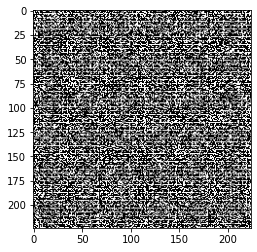

In [40]:
generator = make_generator_model_tensorflow(3, (5,5), traspose= False)

noise = tf.random.normal([1, 100])

generated_image = generator(noise, training=False)
print(generated_image.shape)

plt.imshow(generated_image[0, :, :, 0], cmap='gray')


#**Discriminatore**
Il discriminatoreè un semplice modello basato su una CNN che si occuperà di discriminare le immagini false da quelle vere. 
Lobbiettivo della rete gan sarà ingannare il discriminatore creando immagini sempre migliori

In [41]:
def convSN(model, out_channels, ksize, stride_size):
    model.add(layers.Conv2D(out_channels, (ksize, ksize), strides=(stride_size, stride_size), padding='same',
                     kernel_initializer=weight_initializer, use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())
    model.add(Dropout(0.3))
    return model

In [42]:
def make_discriminator_model(spectral_normalization):
    model = tf.keras.Sequential()
    if spectral_normalization == True:
        
        model.add(layers.Conv2D(64,
                                (5, 5), 
                                strides=(2,2),
                                padding='same',
                                use_bias=False, 
                                input_shape=[224, 224, 3],
                                kernel_initializer=weight_initializer))
        model.add(layers.BatchNormalization())
        model.add(layers.LeakyReLU())
        model.add(layers.Dropout(0.3))

        model = convSN(model, 64, ksize=5, stride_size=2)

        model = convSN(model, 128, ksize=5, stride_size=2)

        model = convSN(model, 256, ksize=5, stride_size=2)

        model.add(layers.Flatten())
        model.add(layers.Dense(1, activation='sigmoid'))
        model.summary()
        return model

    else:
        
        model.add(layers.Conv2D(64, 
                                (5, 5),
                                strides=(2, 2), 
                                padding='same',
                                input_shape=[224,224,3],
                                kernel_initializer=weight_initializer))
        
        model.add(layers.LeakyReLU())
        model.add(layers.Dropout(0.3))

        model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same', kernel_initializer=weight_initializer))
        model.add(layers.LeakyReLU())
        model.add(layers.Dropout(0.3))

        model.add(layers.Conv2D(256, (5, 5), strides=(2, 2), padding='same',kernel_initializer=weight_initializer))
        model.add(layers.LeakyReLU())
        model.add(layers.Dropout(0.3))

        """model.add(layers.Conv2D(512, (5, 5), strides=(2, 2), padding='same',kernel_initializer=weight_initializer))
        model.add(layers.LeakyReLU())
        model.add(layers.Dropout(0.3))"""

        model.add(layers.Flatten())
        model.add(layers.Dense(1))

        return model

###Uso del discriminatore

Usa il discriminatore (non ancora addestrato) per classificare le immagini generate come reali o false. Il modello verrà addestrato per produrre valori positivi per immagini reali e valori negativi per immagini false.

In [43]:
discriminator = make_discriminator_model(spectral_normalization = False)
decision = discriminator(generated_image)
print(decision)

tf.Tensor([[-4405.9404]], shape=(1, 1), dtype=float32)


#Perdita Ottimizzatori 

In [44]:
#il metodo ritorna una funzione per la compilazione della coross entropy loss
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits = True)

###Lables Smoothing

In [45]:
#Tecnica nelle gan per assegnare per non assegnare 1/0 per le lables delle classi, ma assegnamo [0.7, 1.0]
#per i positivi e [0.0, 0.3] per i negativi
def smooth_positive_labels(y):
    return y - 0.3 + (np.random.random(y.shape) * 0.5)

def smooth_negative_labels(y):
    return y + np.random.random(y.shape) * 0.3

#flip random di alcune lables
def noisy_labels(y, p_flip):
    n_select = int(p_flip * int(y.shape[0]))
    flip_ix = np.random.choice([i for i in range(int(y.shape[0]))], size=n_select)
    op_list = []
    for i in range(int(y.shape[0])):
        if i in flip_ix:
            op_list.append(tf.subtract(1, y[i]))
        else:
            op_list.append(y[i])
    
    outputs = tf.stack(op_list)
    return outputs

In [46]:
def discriminator_loss(real_output, fake_output, loss_func, apply_label_smoothing=True, label_noise=True):
    
    if label_noise and apply_label_smoothing:
      real_output_noise = noisy_labels(tf.ones_like(real_output), 0.05)
      fake_output_noise = noisy_labels(tf.zeros_like(fake_output), 0.05)
      real_output_smooth = smooth_positive_labels(real_output_noise)
      fake_output_smooth = smooth_negative_labels(fake_output_noise)
      
      if loss_func == 'gan': 
          real_loss = cross_entropy(tf.ones_like(real_output_smooth), real_output)
          fake_loss = cross_entropy(tf.zeros_like(fake_output_smooth), fake_output)
    
    else:
        real_loss = cross_entropy(tf.ones_like(real_output), real_output)
        fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    
    total_loss = real_loss + fake_loss
    return total_loss

In [47]:
def generator_loss(fake_output, real_output, loss_func, apply_label_smoothing=False):
  if apply_label_smoothing:
        fake_output_smooth = smooth_negative_labels(tf.ones_like(fake_output))
        
        if loss_func == 'gan':
            return cross_entropy(tf.ones_like(fake_output_smooth), fake_output)
        
        else:
            return cross_entropy(tf.ones_like(fake_output), fake_output)

In [48]:
#consigliato per tutte le reti gan come lr iniziale però potrei utilizzare e-4
lr_initial_g = 0.0002
generator_optimizer = tf.keras.optimizers.Adam(learning_rate = lr_initial_g, beta_1 = 0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate = lr_initial_g, beta_1 = 0.5)

###Salva i checkpoint
Salvo i checkpoit, può essere utile nel caso in cui venga interrotta un'attività di addestramento di lunga durata.

In [49]:
checkpoint_dir = f'/content/drive/My Drive/DCGAN/{model_name_folder}'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)
manager = tf.train.CheckpointManager(checkpoint, f'/content/drive/My Drive/DCGAN/{model_name_folder}/{model_name}', max_to_keep=1)

#**Ciclo di addestramento** 

In [50]:
EPOCHS = 200
#aumentare il rumore può aumentare le prestazioni ?? chiedere
noise_dim = 100
num_examples_to_generate = 16

seed = tf.random.normal([num_examples_to_generate, noise_dim])


Il ciclo di addestramento inizia con il generatore che riceve un seme casuale come input. Quel seme viene utilizzato per produrre un'immagine. Il discriminatore viene quindi utilizzato per classificare immagini reali (tratte dal set di addestramento) e immagini false (prodotte dal generatore). La perdita viene calcolata per ciascuno di questi modelli e i gradienti vengono utilizzati per aggiornare il generatore e il discriminatore.

In [51]:
# Notice the use of `tf.function`
# This annotation causes the function to be "compiled".

def train_step(images, loss_type = 'gan'):
    noise = tf.random.normal([BATCH_SIZE, noise_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
      
      generated_images = generator(noise,
                                   training=True)

      real_output = discriminator(images, 
                                  training=True)
      
      fake_output = discriminator(generated_images,
                                  training=True)

      gen_loss = generator_loss(fake_output = fake_output,
                                real_output= real_output,
                                loss_func = 'gan',
                                apply_label_smoothing = True)
      
      disc_loss = discriminator_loss(real_output = real_output,
                                     fake_output = fake_output, 
                                     loss_func = 'gan',
                                     apply_label_smoothing = True,
                                     label_noise = True)
      
    gradients_of_generator = gen_tape.gradient(gen_loss,
                                               generator.trainable_variables)
    
    gradients_of_discriminator = disc_tape.gradient(disc_loss,
                                                    discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, 
                                            generator.trainable_variables))
    
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator,
                                                discriminator.trainable_variables))
    return gen_loss, disc_loss

In [52]:
def train(dataset, epochs, manager):
  
  ###Visto che mi saltava la rete ho messo un sistema di salvataggio di checkpoints
  checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

  if manager.latest_checkpoint:
    print("Restored from {}".format(manager.latest_checkpoint))
  else:
    print("Initializing from scratch.")

  all_gl = np.array([]); all_dl = np.array([])
  lr_initial_g = 0.0002
  lr_initial_d = 0.0002

  for epoch in range(epochs):
    
    start = time.time()
    G_loss = []; D_loss = []
    new_lr_d = lr_initial_d
    new_lr_g = lr_initial_g
    global_step = 0

    for image_batch in dataset:
      
      global_step = global_step + 1
      g_loss, d_loss = train_step(image_batch)
      G_loss.append(g_loss); D_loss.append(d_loss)
      all_gl = np.append(all_gl,np.array([G_loss]))
      all_dl = np.append(all_dl,np.array([D_loss]))
    
    # Produco le gif
    display.clear_output(wait=True)
    generate_and_save_images(generator, epoch + 1, seed)

    #Ogni 5 epoche mostro il grafico della loss
    if (epoch + 1) % 50 == 0:
      plot_losses(G_loss, D_loss, all_gl, all_dl, epoch + 1)
    
    #Salvo il modello ogni 100 epoche di allenamento 
    if (epoch + 1) % 250 == 0:
      checkpoint.save(file_prefix = checkpoint_prefix)

    decay_step = 50
    replay_step = 100
    decay_steps = 1000
    #https://www.tensorflow.org/api_docs/python/tf/compat/v1/train/cosine_decay
    if (epoch + 1) % decay_step == 0:
            new_lr_d = tf.compat.v1.train.cosine_decay(new_lr_d,
                                             min(global_step, decay_steps),
                                             decay_steps)
            new_lr_g = tf.compat.v1.train.cosine_decay(new_lr_g,
                                             min(global_step, decay_steps),
                                              decay_steps)
            generator_optimizer = tf.compat.v1.train.AdamOptimizer(learning_rate=new_lr_d, beta1=0.5)
            discriminator_optimizer = tf.compat.v1.train.AdamOptimizer(learning_rate=new_lr_g, beta1=0.5)          

    print('Epoch: {} computed for {} sec'.format(epoch + 1, time.time() - start))
    print('Gen_loss mean: ', np.mean(G_loss),' std: ', np.std(G_loss))
    print('Disc_loss mean: ', np.mean(D_loss),' std: ', np.std(D_loss))

    print ('Time for epoch {} is {} sec'.format(epoch + 1, time.time()-start))
    # Generate after the final epoch
  display.clear_output(wait=True)
  generate_and_save_images(generator, epochs, seed)
  plot_losses(G_loss, D_loss, all_gl, all_dl, epoch + 1)
  save_model(generator = generator, model_name_folder = model_name_folder, model_name = model_name)

In [53]:
def plot_losses(G_losses, D_losses, all_gl, all_dl, epoch):
    plt.figure(figsize=(10,5))
    plt.title("Generator and Discriminator Loss - EPOCH {}".format(epoch))
    plt.plot(G_losses,label="G")
    plt.plot(D_losses,label="D")
    plt.xlabel("Iterations")
    plt.ylabel("Loss")
    plt.legend()
    ymax = plt.ylim()[1]
    plt.show()
    
    plt.figure(figsize=(10,5))
    plt.plot(np.arange(len(all_gl)),all_gl,label='G')
    plt.plot(np.arange(len(all_dl)),all_dl,label='D')
    plt.legend()
    plt.title('All Time Loss')
    plt.show()

###Genera e salva immagini


In [54]:
def generate_and_save_images(model, epoch, test_input):
  predictions = model(test_input, training=False)

  fig = plt.figure(figsize=(4,4))

  for i in range(predictions.shape[0]):
      plt.subplot(4, 4, i+1)
      plt.imshow(predictions[i, :, :, 0], cmap='gray') #* 127.5 + 127.5)
      plt.axis('off')

  plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
  #salvare immagini generate dentro un file ?
  plt.show()

#**Addestra il modello**
Chiama il metodo train() definito sopra per addestrare il generatore e il discriminatore simultaneamente. È importante che il generatore e il discriminatore non si superino a vicenda cioè si devono alleare a un ritmo simile.

All'inizio della formazione, le immagini generate sembrano rumori casuali. Con il progredire della formazione, le cifre generate appariranno sempre più reali. Dopo circa 50 epoche generalemte le immagini iniziano ad avere una forma simile a quelle da noi cericate.

In [55]:
def zip_images(filename='images.zip'):
    # SAVE TO ZIP FILE NAMED IMAGES.ZIP
    z = zipfile.PyZipFile(filename, mode='w')
    for k in range(image_sample_size):
        generated_image = generator(tf.random.normal([1, noise_dim]), training=False)
        f = str(k)+'.png'
        img = np.array(generated_image)
        img = (img[0, :, :, :] + 1.) / 2.
        img = Image.fromarray((255*img).astype('uint8').reshape((image_height,image_width,image_channels)))
        img.save(f,'PNG')
        z.write(f)
        os.remove(f)
        #if k % 1000==0: print(k)
    z.close()
    print('Saved final images for submission.')
    
def save_images(directory, generator):
  #devo mettere il numero di sample che voglio generare 
    for k in range(40):
        #devo mettere il mio generatore
        generated_image = generator(tf.random.normal([1, 100]), training=False)
        f = str(k)+'.png'
        f = os.path.join(directory, f)
        img = np.array(generated_image)
        img = (img[0, :, :, :] + 1.) / 2.
        #devo fare il reshape con i valori dell'immagine che ho 
        image_height = 224  
        image_width = 224 
        image_channels = 3
        img = Image.fromarray((255*img).astype('uint8').reshape((image_height, image_width, image_channels)))
        img.save(f,'PNG')
        #if k % 1000==0: print(k)
    print('Saved temporary images for evaluation.')

la loss del discriminatore si aggira sempre intorno: 1.1 - 1.3
la loss del generatore si aggira sempre intorno: 0.8 - 1.1
std gen : 0.40 - 0.5 std disc: 0.1 - 0.2

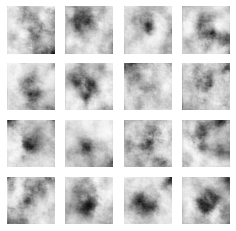

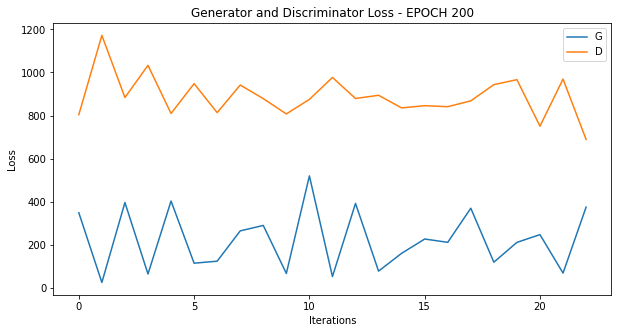

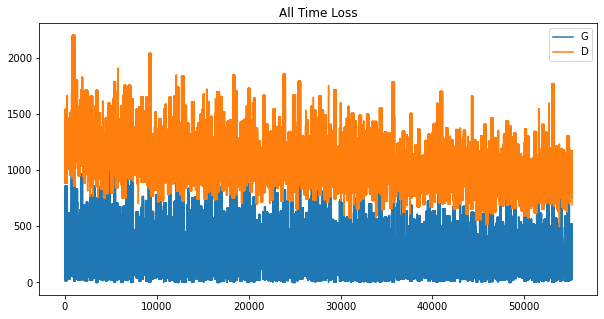

INFO:tensorflow:Assets written to: /content/drive/My Drive/DCGAN/modello_n_1/modello_benigni/assets
INFO:tensorflow:Assets written to: /content/drive/My Drive/DCGAN/modello_n_1/modello_benigni/assets


In [56]:
train(train_benign, EPOCHS, manager)

#Crea una GIF

In [57]:
# Display a single image using the epoch number
def display_image(epoch_no):
  return PIL.Image.open('image_at_epoch_{:04d}.png'.format(epoch_no))

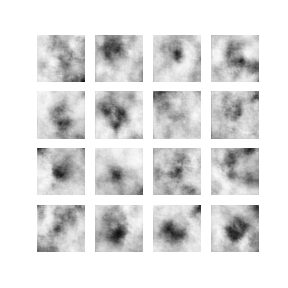

In [58]:
display_image(EPOCHS)

Usa imageio per creare una gif animata utilizzando le immagini salvate durante l'allenamento.

In [59]:
anim_file = 'dcgan.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('image*.png')
  filenames = sorted(filenames)
  for filename in filenames:
    image = imageio.imread(filename)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)


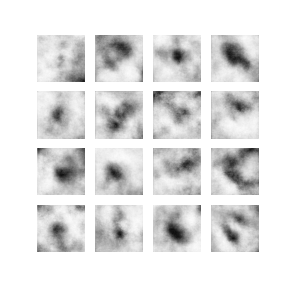

In [60]:
import tensorflow_docs.vis.embed as embed
embed.embed_file(anim_file)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

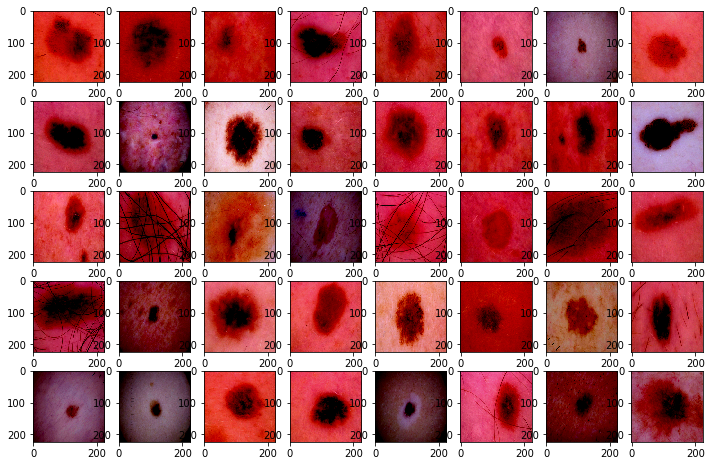

In [61]:
columns = 8
rows = 5
fig=plt.figure(figsize=(12, 8))

for i in range(1, columns*rows +1):
    ax = fig.add_subplot(rows, columns, i)
    plt.imshow(X_benign[i], interpolation= 'nearest')
plt.show()

#Secondo allnemanto

In [62]:
reconstructed_model = keras.models.load_model(f'/content/drive/MyDrive/DCGAN/modello_n_1/modello_benigni')

In [64]:
os.mkdir(f'/content/drive/MyDrive/DCGAN/{model_name_folder}/{model_name}/images')
save_images(f'/content/drive/MyDrive/DCGAN/{model_name_folder}/{model_name}/images',
            reconstructed_model)

Saved temporary images for evaluation.


generate caricate


IndexError: ignored

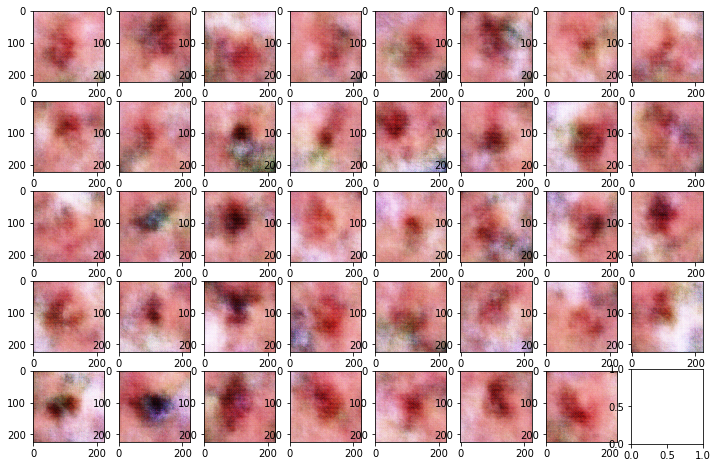

In [65]:
model_name_folder = 'modello_n_1'
model_name = 'modello_benigni'
folder_generated_b = f'/content/drive/MyDrive/DCGAN/{model_name_folder}/{model_name}/images'
read = lambda imname: np.asarray(Image.open(imname).convert('RGB'))
ims_genereted_b = [read(os.path.join(folder_generated_b, filename)) for filename in os.listdir(folder_generated_b)]
X_generated_b = np.array(ims_genereted_b, dtype='uint8')
print("generate caricate")

X_generated_b = X_generated_b.reshape(X_generated_b.shape[0], 224, 224, 3).astype('uint8')
X_generated_b= X_generated_b  / 255
columns = 8
rows = 5
fig=plt.figure(figsize=(12, 8))

for i in range(1, columns*rows +1):
    ax = fig.add_subplot(rows, columns, i)
    plt.imshow(X_generated_b[i], interpolation= 'nearest')
plt.show()
